In [1]:
# !pip install icevision[all,dev]

In [2]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

## Imports

In [3]:
from icevision.all import *
from fastai.callback.wandb import *
from fastai.callback.tracker import SaveModelCallback
import wandb
from datetime import *

In [1]:
# #Download Datset 
# #Uncomment on first use to download and extract dataset
# from pydrive.auth import GoogleAuth
# from pydrive.drive import GoogleDrive
# from google.colab import auth
# from oauth2client.client import GoogleCredentials

# auth.authenticate_user()
# gauth = GoogleAuth()
# gauth.credentials = GoogleCredentials.get_application_default()
# drive = GoogleDrive(gauth)

# downloaded = drive.CreateFile({'id':"1BCqjhvI9k6h65qM6ZLTwXgdzRVH08tFD"})  
# downloaded.GetContentFile('WSI_PATCHES.7z') 

# #Unpack zip
# !p7zip -d WSI_PATCHES.7z

In [6]:
data_dir = Path('./WSI_PATCHES/Mitosis_1cls_512px_100ds')
data_dir_name = data_dir.stem

In [7]:
parser = parsers.coco(annotations_file=data_dir / "Coco.json",
                     img_dir=data_dir / 'patches',
                     mask=False)

In [9]:
#Parameters

#Class Map
# class_map = ClassMap(['unkown','mitotic figure'])
# class_map = ClassMap(['unkown','granulocyte', 'mitotic figure', 'tumor cell'])
class_map = ClassMap(['unkown','mitotic figure'])


params = dict(
    epochs=20,
    classes=len(class_map),
    class_map=class_map,
    size=512,
    size_trans=768,
    batch_size=16,
    learning_rate=3e-2,
    ds_size=500,
    run='1',
    architecture="CNN",
    model='tf_efficientdet_d2',
    modelclass='EffDet',
    infrastructure='Colab GPU'
    )
params.update(dataset="Mitosis_1Class_"+str(params['size']))
params.update(wandb_run_name = params['modelclass'] + '_' + data_dir_name + '_' + params['run'] +'_'+ date.today().strftime("%m%d%Y"))
params.update(project= 'Mitosis02')
# print(params)

size = params['size']
size_trans = params['size_trans']


In [10]:
# Records
train_records, valid_records = parser.parse()

params.update(train_ds_size=len(train_records))
params.update(valid_ds_size=len(valid_records))

INFO     - Autofixing records | icevision.parsers.parser:parse:124


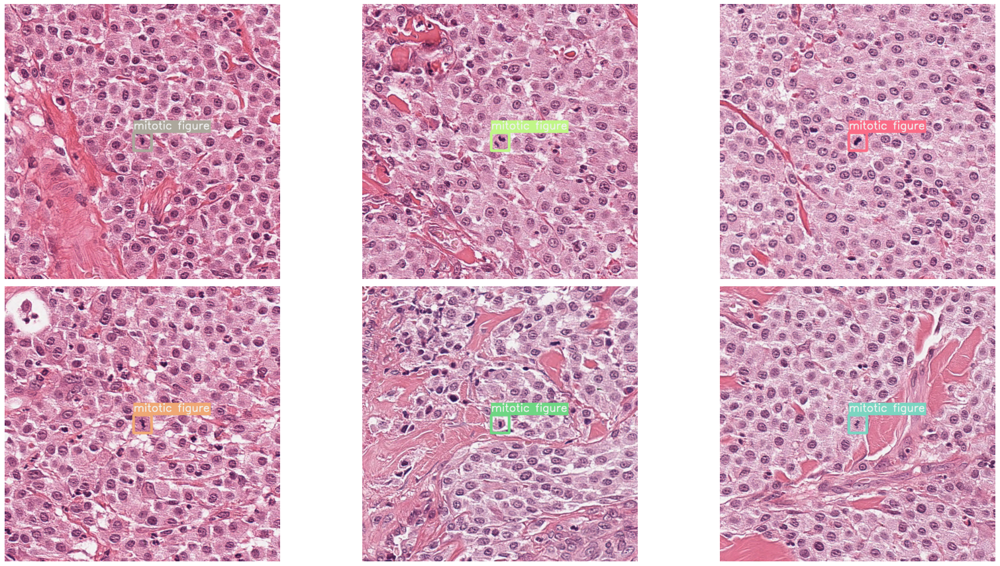

In [11]:
show_records(train_records[:6], ncols=3, class_map=class_map)

In [12]:
# Transforms
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=size_trans, presize=size), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size_trans), tfms.A.Normalize()])

In [13]:
# Datasets
train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

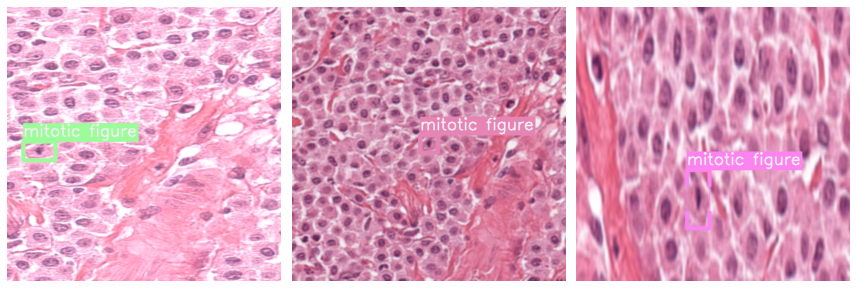

In [14]:
samples = [train_ds[0] for _ in range(3)]
show_samples(samples, ncols=3, class_map=class_map)

## DataLoader

In [15]:
# DataLoaders
train_dl = efficientdet.train_dl(train_ds, batch_size=params['batch_size'], num_workers=0, shuffle=True)
valid_dl = efficientdet.valid_dl(valid_ds, batch_size=params['batch_size'], num_workers=0, shuffle=False)

train_dl.batch_size

5

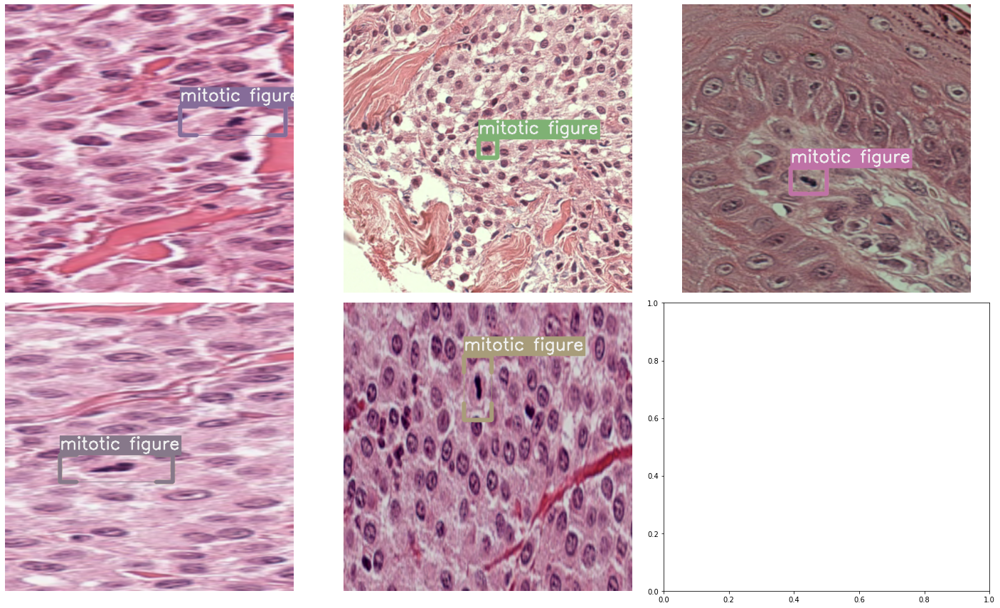

In [16]:
batch, samples = first(train_dl)
show_samples(samples[:6], class_map=class_map, ncols=3)

## Model & Metrics Setup

In [19]:
#EfficeientDet Model Config
model = efficientdet.model(model_name='tf_efficientdet_d2', 
                           num_classes=len(class_map), 
                           img_size=size_trans)

#Additional Models: tf_efficientdet_lite0

In [20]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

In [21]:
#WanDB Config
#Uncomment two lines below to initialize wandb

# wandb.init(project=params['project'], name=params['wandb_run_name'], config=params)
# config = wandb.config

## Training


In [22]:
learn = efficientdet.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics)
#Uncomment below to invoke wandb callback
# learn = efficientdet.fastai.learner(dls=[train_dl, valid_dl], 
#                                     model=model, 
#                                     metrics=metrics,
#                                     cbs=[WandbCallback(log_dataset=False, log_model=False)]
#                                    )

SuggestedLRs(lr_min=0.005754399299621582, lr_steep=0.015848932787775993)

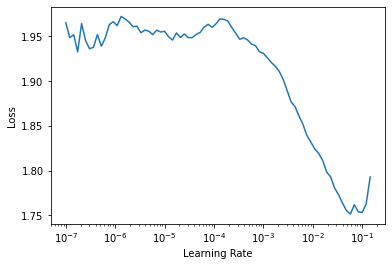

In [24]:
learn.freeze()
learn.lr_find()

In [25]:
# learn.fine_tune(10, 3e-2, freeze_epochs=10)
learn.fine_tune(30, 5e-2)
# learn.fine_tune(config.epochs, lr=config.learning_rate)

epoch,train_loss,valid_loss,COCOMetric,time
0,1.674877,5.796552,0.000000,00:03


epoch,train_loss,valid_loss,COCOMetric,time
0,1.497086,4.643734,0.000021,00:03
1,1.426078,4.189957,0.000000,00:03
2,1.360017,24.491137,0.000189,00:03
3,1.294708,172.171478,0.001924,00:03
4,1.254765,307.546326,0.000045,00:03
5,1.204570,1294.908691,0.000000,00:03
6,1.178693,448.271179,0.000049,00:03
7,1.159572,691.126831,0.000142,00:03
8,1.156279,10339.640625,0.000000,00:03
9,1.116451,6630.157227,0.000000,00:03


In [26]:
learn.freeze()
# learn.lr_find()

In [27]:
learn.fine_tune(10, 3e-7)

epoch,train_loss,valid_loss,COCOMetric,time
0,0.527721,3.547703,0.280258,00:02


epoch,train_loss,valid_loss,COCOMetric,time
0,0.669261,2.926093,0.293866,00:03
1,0.637615,2.260990,0.309041,00:03
2,0.618502,1.980167,0.322801,00:03
3,0.616185,1.648402,0.314975,00:03
4,0.600346,1.561224,0.294302,00:03
5,0.634432,1.389775,0.309185,00:03
6,0.651156,1.284765,0.313679,00:03
7,0.641218,1.114946,0.316513,00:03
8,0.646667,1.021438,0.310391,00:03
9,0.658041,0.942699,0.314954,00:03


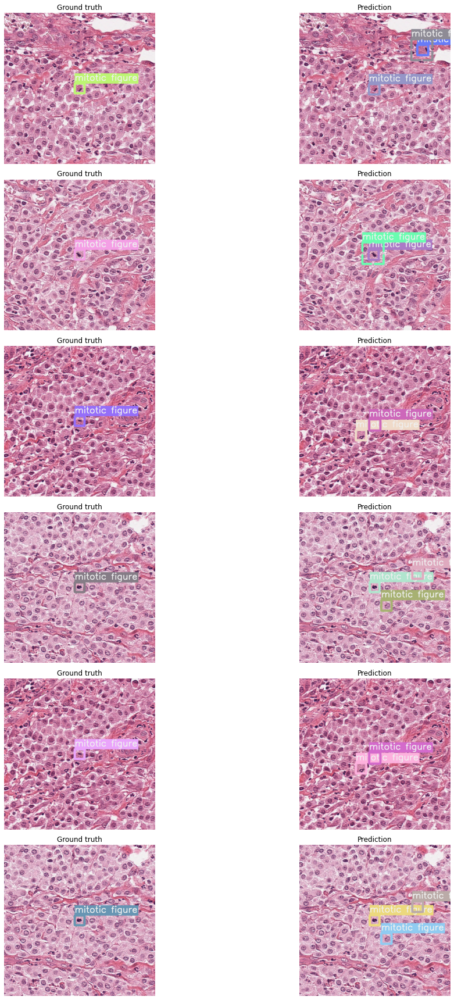

In [28]:
efficientdet.show_results(model, valid_ds, class_map=class_map)

In [29]:
valid_test_dl = efficientdet.infer_dl(valid_ds, batch_size=params['batch_size'])
samples, preds = efficientdet.predict_dl(model, valid_test_dl)

In [30]:
# wandb_images = wandb_img_preds(samples, preds, class_map, add_ground_truth=True) 

In [31]:
# wandb.log({"Predicted images": wandb_images})
# wandb.join()

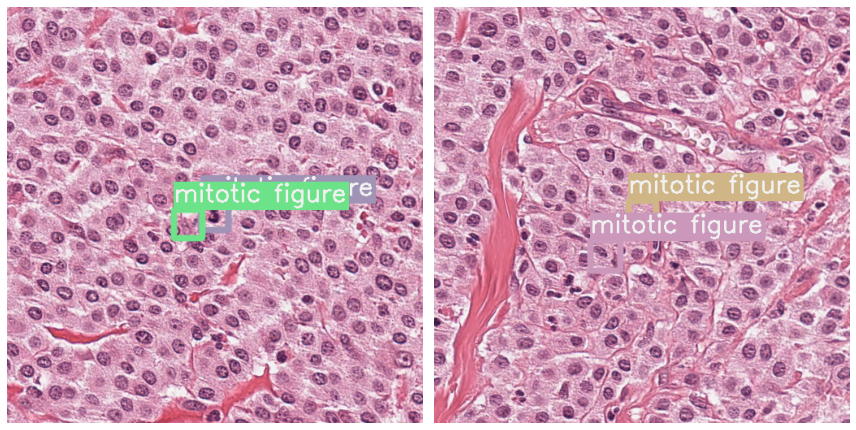

In [32]:
# Show inference on validation dataset
imgs = [sample["img"] for sample in samples]
imgs=imgs[:2]
show_preds(
    imgs,
    preds=preds[:2],
    class_map=class_map,
    denormalize_fn=denormalize_imagenet,
    ncols=2,
)

In [33]:
#Save model weights
torch.save(model.state_dict(), data_dir/'mitosis_tf_efficientdet_lite0.pth')

## Prediction from Saved Model

In [34]:
print(class_map)

<ClassMap: {'background': 0, 'unkown': 1, 'mitotic figure': 2}>


In [38]:
# data_dir_test = './WSI_PATCHES/MitosisTest_512px_2ds'
# data_dir_test = './WSI_PATCHES/MitosisTest_1024px_2ds'
data_dir_test = './WSI_PATCHES/MitosisTest_768px_2ds'
size_test = '768px'

(2, 768, 768, 3)

In [39]:
print('size=',size)
print('size_trans=',size_trans)

size= 384
size_trans= 512


In [40]:
test_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size_trans), tfms.A.Normalize()])
infer_ds = Dataset.from_images(images, test_tfms)

In [41]:
parser_tst = parsers.coco(annotations_file=data_dir_test / 'Coco.json',
                     img_dir=data_dir_test / 'patches',
                     mask=False)

<All keys matched successfully>

In [ ]:
test_records = parser_tst.parse(data_splitter=SingleSplitSplitter())
test_records = test_records[0]
len(test_records)

In [ ]:
show_records(test_records, ncols=2, class_map=class_map)

In [ ]:
test_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size), tfms.A.Normalize()])
test_infer_ds = Dataset(test_records, test_tfms)

In [ ]:
#Load Model
model2 = faster_rcnn.model(backbone=backbone, num_classes=len(class_map))
state_dict = torch.load(data_dir/model_saved)
model2.load_state_dict(state_dict)

In [ ]:
faster_rcnn.show_results(model, test_infer_ds, class_map=class_map)

In [42]:
infer_dl = efficientdet.infer_dl(infer_ds, batch_size=1)
samples_inf, preds_inf = efficientdet.predict_dl(model=model2, infer_dl=infer_dl)

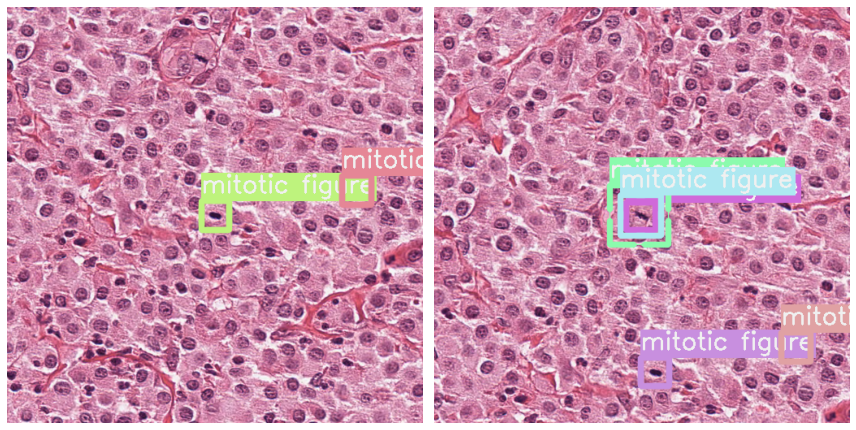

In [45]:
# Show samples
imgs = [sample["img"] for sample in samples_inf]
imgs=imgs[:4]
show_preds(
    imgs,
    preds=preds_inf[:4],
    class_map=class_map,
    denormalize_fn=denormalize_imagenet,
    ncols=2,
)

In [45]:
# wandb_images_test = wandb_img_preds(samples_inf, preds_inf, class_map, add_ground_truth=False) 

In [ ]:
# wandb.log({"Test Image Predictions-" + size_test: wandb_images_test})
wandb.join()